# Meta-Reinforcement Learning with MAML

In this assignment notebook, we will implement **Model-Agnostic Meta-Learning (MAML)** from scratch for a custom `HalfCheetahBackward` environment. The goal is to learn policy parameters that can quickly adapt to new tasks in this case, running the HalfCheetah agent **backward** with just a few gradient steps. Each section below provides context and key steps.

In [1]:
!pip -q install gymnasium[mujoco]
!pip install imageio -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.5/243.5 kB 9.7 MB/s eta 0:00:00


## Environment & Dependencies


In [2]:
import gymnasium as gym
import random
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
from collections import namedtuple, deque
import imageio
from copy import deepcopy
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal
from torch.distributions import Categorical

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')


This is necessary for running the HalfCheetah env on colab.

In [3]:
%env MUJOCO_GL=egl

env: MUJOCO_GL=egl


This code displays a saved mp4 file.

In [4]:
from IPython.display import HTML
from base64 import b64encode

def show_video(path):
    mp4 = open(path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML("""
    <video width=400 controls>
          <source src="%s" type="video/mp4">
    </video>
    """ % data_url)

Run this code to get started with the HalfCheetah environment.

In [5]:
env = gym.make("HalfCheetah-v5", render_mode="rgb_array")

# Gymnasium reset returns (obs, info)
obs, _ = env.reset()

frames = []
max_steps = 1000   # total frames to collect (change as you like)

for _ in range(max_steps):
    # choose action: here a random action from the env's action space
    action = env.action_space.sample()   # TODO: replace with your policy action

    # Gymnasium step returns: obs, reward, terminated, truncated, info
    obs, reward, terminated, truncated, info = env.step(action)

    # render the current frame (rgb_array because we created env with render_mode="rgb_array")
    frame = env.render()
    frames.append(frame)

    # if episode ended, reset and continue collecting
    if terminated or truncated:
        obs, _ = env.reset()

env.close()

# save as mp4 and display
imageio.mimsave('./HalfCheetah.mp4', frames, fps=20)
show_video('./HalfCheetah.mp4')

We modify the HalfCheetah environment by creating a wrapper on top it to reward the model for moving backwards.

In [6]:
class HalfCheetahBackward(gym.Env):
    def __init__(self):
        super().__init__()
        self.env = gym.make("HalfCheetah-v5", render_mode="rgb_array")
        self.forward_reward_weight = 1.0
        self.ctrl_cost_weight = 0.05

        # Forward spaces to the wrapper
        self.observation_space = self.env.observation_space
        self.action_space = self.env.action_space

    def reset(self, *, seed=None, options=None):
        obs, info = self.env.reset(seed=seed, options=options)
        return obs, info

    def step(self, action):
        obs, _, done, tr, info = self.env.step(action)
        reward = -1.0 * info["reward_forward"] + 0.05 * info["reward_ctrl"]
        return obs, reward, done, tr, info

    def render(self):
        return self.env.render()

    def close(self):
        self.env.close()


## Gaussian Policy Network
We parameterize our policy π_θ(a|s) as a multivariate Gaussian:
\[
$μ_θ(s) = f_θ(s), \quad Σ_θ = \text{diag}(\exp(2φ))$
\]
Here, `mean_head` outputs μ_θ(s) and `log_std` (φ) is a learned vector of log-standard deviations. Sampling and computing log-probabilities from this distribution is essential for the policy gradient update.

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Normal

class Policy(nn.Module):
    def __init__(self, obs_dim, act_dim, hidden_sizes=(64, 64)):
        super().__init__()

        # Build MLP layers
        layers = []
        last_size = obs_dim
        for size in hidden_sizes:
            layers.append(nn.Linear(last_size, size))
            layers.append(nn.ReLU())
            last_size = size
        self.net = nn.Sequential(*layers)

        # Mean head for Gaussian policy
        self.mean_head = nn.Linear(last_size, act_dim)

        # Log std (learnable parameter, one per action dimension)
        self.log_std = nn.Parameter(torch.zeros(act_dim))

    def forward(self, x):
        """Forward pass: returns mean and std for Normal distribution."""
        h = self.net(x)
        mean = self.mean_head(h)
        std = torch.exp(self.log_std)   # ensure positivity
        return mean, std

    def get_action(self, obs):
        """Sample an action and return (action, distribution)."""
        if not isinstance(obs, torch.Tensor):
            obs = torch.as_tensor(obs, dtype=torch.float32)

        mean, std = self(obs)
        dist = Normal(mean, std)
        action = dist.sample()   # reparameterization trick can also be used: dist.rsample()
        return action, dist


## Trajectory Collection & Return Computation
The `rollout` function runs the policy in the environment for up to `max_steps`, storing:
- Observations **s_t**
- Actions **a_t** sampled from π_θ
- Log-probabilities **log π_θ(a_t|s_t)**
- Rewards **r_t**
After the episode, we compute discounted returns:
\[
$G_t = \sum_{k=0}^{T-t} γ^k r_{t+k}$
\]
These returns serve as our baselines for policy gradient estimation.

In [8]:
def rollout(env, policy, max_steps=200, gamma=0.99):
    obs, _ = env.reset()
    obs_buf, logp_buf, rewards = [], [], []

    for _ in range(max_steps):
        obs_tensor = torch.as_tensor(obs, dtype=torch.float32).unsqueeze(0)
        action, dist = policy.get_action(obs_tensor)

        # detach to numpy for env step
        action_np = action.squeeze(0).detach().cpu().numpy()
        next_obs, reward, terminated, truncated, info = env.step(action_np)

        # store buffers
        obs_buf.append(obs_tensor.squeeze(0))
        logp_buf.append(dist.log_prob(action).sum(axis=-1))
        rewards.append(reward)

        obs = next_obs
        if terminated or truncated:
            break

    # compute discounted returns
    returns = []
    G = 0
    for r in reversed(rewards):
        G = r + gamma * G
        returns.insert(0, G)

    ret_buf = torch.tensor(returns, dtype=torch.float32)
    obs_buf = torch.stack(obs_buf)
    logp_buf = torch.stack(logp_buf)

    return obs_buf, logp_buf, ret_buf


Complete this section to evaluate the model and save a sample trajectory.

In [9]:
def evaluate(model, env, num_episodes=10, max_episode_len=200, path="./Final_Evaluation.mp4", no_video=False):
    frames = []
    total_rewards = []

    for episode in range(num_episodes):
        obs, _ = env.reset()
        ep_reward = 0

        for t in range(max_episode_len):
            obs_tensor = torch.as_tensor(obs, dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                action, dist = model.get_action(obs_tensor)
            action_np = action.squeeze(0).cpu().numpy()

            obs, reward, terminated, truncated, info = env.step(action_np)
            ep_reward += reward

            if not no_video:
                frame = env.render()
                frames.append(frame)

            if terminated or truncated:
                break

        total_rewards.append(ep_reward)

    mean_rewards = np.mean(total_rewards)
    print(f"Mean Reward: {mean_rewards:.2f}")

    if not no_video:
        imageio.mimsave(path, frames, fps=20)

    env.close()


## Model-Agnostic Meta-Learning (MAML)
MAML seeks initial parameters $\theta$ that can adapt to a new task with only a few gradient steps. For each task Tᵢ, we perform an **inner loop** update:

\[
$\theta'_i = \theta - α \nabla_\theta \mathcal{L}_{T_i}(\theta)$
\]

Then, the **meta-objective** (outer loop) minimizes the post-adaptation loss (optimize for the initial parameter $\theta$):

\[
$\min_\theta \sum_i \mathcal{L}_{T_i}(\theta'_i) = \sum_i \mathcal{L}_{T_i}\bigl(\theta - α \nabla_\theta \mathcal{L}_{T_i}(\theta)\bigr)$
\]


In [15]:
from copy import deepcopy
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

class MAML_Alt:
    def __init__(
        self,
        task_env_cls,
        inner_lr,
        outer_lr,
        inner_steps,
        meta_batch_size,
        max_episode_len=200,
        gamma=0.99,
    ):
        self.task_env_cls = task_env_cls
        self.inner_lr = inner_lr
        self.inner_steps = inner_steps
        self.meta_batch_size = meta_batch_size
        self.max_episode_len = max_episode_len
        self.gamma = gamma

        self.loss_history = []
        self.reward_history = []

        # instantiate a temporary env to read space shapes
        tmp_env = task_env_cls()
        obs_dim = int(np.prod(tmp_env.env.observation_space.shape))
        act_dim = int(np.prod(tmp_env.env.action_space.shape))
        tmp_env.close()

        # meta-policy and outer optimizer
        self.meta_policy = Policy(obs_dim, act_dim).to(device)
        self.meta_opt = optim.Adam(self.meta_policy.parameters(), lr=outer_lr, weight_decay=1e-4)

    def _compute_policy_gradient_loss(self, logps, returns):
        """Policy gradient loss: negative expected return-weighted log-prob."""
        return -(logps * returns).mean()

    def inner_update(self, env):
        """
        Collect a support trajectory with the current meta-policy,
        compute the inner loss, and return gradients w.r.t. meta-policy params.
        This mirrors the pattern in your code: compute grads on meta params
        (with create_graph=True) and return them for a manual weight update.
        """
        obs_s, logp_s, ret_s = rollout(env, self.meta_policy, self.max_episode_len, self.gamma)

        pg_loss = self._compute_policy_gradient_loss(logp_s, ret_s)

        # small L2 reg on parameters (stabilizes inner optimization)
        l2_coeff = 1e-3
        params_concat_norm2 = sum((p.norm() ** 2) for p in self.meta_policy.parameters())
        inner_loss = pg_loss + l2_coeff * params_concat_norm2

        # compute gradients w.r.t. meta-policy parameters (retain graph for meta-update)
        grads = torch.autograd.grad(inner_loss, self.meta_policy.parameters(), create_graph=True)

        return grads

    def make_adapted_policy(self, grads):
        """
        Create a shallow copy of the meta-policy and apply one gradient step
        using the provided grads (data-level update). This follows the same
        approach as your reference: compute grads first, then update a copy.
        """
        adapted = deepcopy(self.meta_policy)
        for p_adapt, g in zip(adapted.parameters(), grads):
            # data-level update so the adapted model can be used for rollout
            p_adapt.data = p_adapt.data - self.inner_lr * g.data if g is not None else p_adapt.data
        return adapted

    def meta_step(self):
        """
        One meta-iteration: for meta_batch_size tasks,
        - compute inner gradients,
        - form adapted policy,
        - evaluate adapted policy on query trajectories,
        - average query losses and update meta-policy.
        """
        total_meta_loss = 0.0
        total_query_reward = 0.0

        for _ in range(self.meta_batch_size):
            env = self.task_env_cls()

            # 1) inner: collect support data and compute grads
            grads = self.inner_update(env)

            # 2) form adapted policy with the computed grads
            adapted_policy = self.make_adapted_policy(grads)

            # 3) query: collect trajectory using adapted policy and compute loss
            obs_q, logp_q, ret_q = rollout(env, adapted_policy, self.max_episode_len, self.gamma)
            query_loss = self._compute_policy_gradient_loss(logp_q, ret_q)

            total_meta_loss += query_loss
            total_query_reward += ret_q.mean().item()

            env.close()

        # Average across tasks
        meta_loss = total_meta_loss / float(self.meta_batch_size)

        # Outer update
        self.meta_opt.zero_grad()
        meta_loss.backward()
        self.meta_opt.step()

        # Logging
        self.loss_history.append(meta_loss.item())
        self.reward_history.append(total_query_reward / float(self.meta_batch_size))

        return meta_loss.item()

    def train(self, meta_iters=501, log_every=10):
        """
        Run the meta-training loop.
        Returns the final meta-policy.
        """
        for it in tqdm(range(1, meta_iters)):
            loss = self.meta_step()
            if it % log_every == 0:
                recent_reward = self.reward_history[-1] if self.reward_history else float('nan')
                print(f"[Iter {it}] meta_loss={loss:.4f}, avg_query_reward={recent_reward:.4f}")

        self._plot_metrics()
        return self.meta_policy

    def _plot_metrics(self):
        iters = range(1, len(self.loss_history) + 1)
        plt.figure(figsize=(8,4))
        plt.plot(iters, self.loss_history, label="Meta Loss")
        plt.plot(iters, self.reward_history, label="Avg Query Reward")
        plt.xlabel("Iteration")
        plt.ylabel("Value")
        plt.title("MAML Training Progress")
        plt.legend()
        plt.show()

    def train(self, meta_iters=501):
        for it in tqdm(range(1, meta_iters)):
            loss = self.meta_step()
            if it % 10 == 0:
                print(f"\t[Iter {it}]\tloss={loss:.3f},\treward={self.reward_history[-1]:.3f}")
        self.plot_metrics()
        return self.meta_policy

    def plot_metrics(self):
        iters = range(1, len(self.loss_history) + 1)

        plt.figure()
        plt.plot(iters, self.loss_history, label="Loss")
        plt.plot(iters, self.reward_history, label="Avg Query Reward")
        plt.xlabel("Iteration")
        plt.legend()
        plt.title("Training Progress")
        plt.show()

## Training Loop
The `train()` function instantiates the `MAML` class with hyperparameters and executes the meta-training.

In [16]:
def train(inner_lr, outer_lr, inner_steps, meta_batch_size, max_episode_len, gamma=0.99):
    maml = MAML(
        task_env_cls=HalfCheetahBackward,
        inner_lr=inner_lr,
        outer_lr=outer_lr,
        inner_steps=inner_steps,
        meta_batch_size=meta_batch_size,
        max_episode_len=max_episode_len,
        gamma=gamma
    )
    meta_policy = maml.train(meta_iters=500)
    return meta_policy

  2%|▏         | 10/499 [00:33<24:12,  2.97s/it]

	[Iter 10]	loss=18.195,	reward=2.310


  4%|▍         | 20/499 [00:59<19:55,  2.50s/it]

	[Iter 20]	loss=22.251,	reward=2.607


  6%|▌         | 30/499 [01:25<19:43,  2.52s/it]

	[Iter 30]	loss=-50.958,	reward=-6.075


  8%|▊         | 40/499 [01:50<19:20,  2.53s/it]

	[Iter 40]	loss=-3.212,	reward=-0.344


 10%|█         | 50/499 [02:16<18:46,  2.51s/it]

	[Iter 50]	loss=-4.640,	reward=-0.469


 12%|█▏        | 60/499 [02:41<18:20,  2.51s/it]

	[Iter 60]	loss=-10.380,	reward=-1.139


 14%|█▍        | 70/499 [03:07<17:55,  2.51s/it]

	[Iter 70]	loss=-78.481,	reward=-9.189


 16%|█▌        | 80/499 [03:32<17:42,  2.54s/it]

	[Iter 80]	loss=60.680,	reward=7.090


 18%|█▊        | 90/499 [03:58<17:04,  2.51s/it]

	[Iter 90]	loss=-5.358,	reward=-0.320


 20%|██        | 100/499 [04:24<16:49,  2.53s/it]

	[Iter 100]	loss=4.873,	reward=0.616


 22%|██▏       | 110/499 [04:49<16:05,  2.48s/it]

	[Iter 110]	loss=-5.390,	reward=-0.692


 24%|██▍       | 120/499 [05:15<15:39,  2.48s/it]

	[Iter 120]	loss=-11.340,	reward=-1.356


 26%|██▌       | 130/499 [05:41<15:25,  2.51s/it]

	[Iter 130]	loss=55.894,	reward=6.642


 28%|██▊       | 140/499 [06:06<14:43,  2.46s/it]

	[Iter 140]	loss=-70.310,	reward=-8.191


 30%|███       | 150/499 [06:32<14:58,  2.58s/it]

	[Iter 150]	loss=37.060,	reward=4.363


 32%|███▏      | 160/499 [06:58<14:47,  2.62s/it]

	[Iter 160]	loss=-59.248,	reward=-6.931


 34%|███▍      | 170/499 [07:24<14:37,  2.67s/it]

	[Iter 170]	loss=9.104,	reward=1.125


 36%|███▌      | 180/499 [07:50<13:54,  2.62s/it]

	[Iter 180]	loss=0.850,	reward=0.051


 38%|███▊      | 190/499 [08:18<14:04,  2.73s/it]

	[Iter 190]	loss=42.559,	reward=4.960


 40%|████      | 200/499 [08:44<12:53,  2.59s/it]

	[Iter 200]	loss=-134.014,	reward=-15.749


 42%|████▏     | 210/499 [09:10<12:29,  2.59s/it]

	[Iter 210]	loss=-45.426,	reward=-5.219


 44%|████▍     | 220/499 [09:35<11:50,  2.55s/it]

	[Iter 220]	loss=21.604,	reward=2.660


 46%|████▌     | 230/499 [10:02<11:38,  2.60s/it]

	[Iter 230]	loss=-59.261,	reward=-7.090


 48%|████▊     | 240/499 [10:28<10:58,  2.54s/it]

	[Iter 240]	loss=20.081,	reward=2.332


 50%|█████     | 250/499 [10:53<10:22,  2.50s/it]

	[Iter 250]	loss=-99.164,	reward=-11.758


 52%|█████▏    | 260/499 [11:19<10:16,  2.58s/it]

	[Iter 260]	loss=0.010,	reward=-0.085


 54%|█████▍    | 270/499 [11:44<09:37,  2.52s/it]

	[Iter 270]	loss=28.727,	reward=3.268


 56%|█████▌    | 280/499 [12:10<09:10,  2.51s/it]

	[Iter 280]	loss=-39.954,	reward=-4.708


 58%|█████▊    | 290/499 [12:35<08:43,  2.50s/it]

	[Iter 290]	loss=19.294,	reward=2.252


 60%|██████    | 300/499 [13:02<08:26,  2.55s/it]

	[Iter 300]	loss=14.532,	reward=1.748


 62%|██████▏   | 310/499 [13:27<07:53,  2.51s/it]

	[Iter 310]	loss=21.239,	reward=2.557


 64%|██████▍   | 320/499 [13:53<07:24,  2.48s/it]

	[Iter 320]	loss=101.516,	reward=11.780


 66%|██████▌   | 330/499 [14:19<07:16,  2.58s/it]

	[Iter 330]	loss=-0.471,	reward=-0.130


 68%|██████▊   | 340/499 [14:44<06:48,  2.57s/it]

	[Iter 340]	loss=-80.995,	reward=-9.518


 70%|███████   | 350/499 [15:10<06:23,  2.57s/it]

	[Iter 350]	loss=-96.175,	reward=-11.305


 72%|███████▏  | 360/499 [15:36<06:12,  2.68s/it]

	[Iter 360]	loss=59.916,	reward=7.128


 74%|███████▍  | 370/499 [16:02<05:45,  2.68s/it]

	[Iter 370]	loss=43.235,	reward=5.077


 76%|███████▌  | 380/499 [16:27<05:17,  2.66s/it]

	[Iter 380]	loss=-20.914,	reward=-2.352


 78%|███████▊  | 390/499 [16:53<04:46,  2.63s/it]

	[Iter 390]	loss=24.005,	reward=2.859


 80%|████████  | 400/499 [17:19<04:23,  2.66s/it]

	[Iter 400]	loss=59.178,	reward=6.927


 82%|████████▏ | 410/499 [17:44<03:50,  2.59s/it]

	[Iter 410]	loss=-54.379,	reward=-6.438


 84%|████████▍ | 420/499 [18:10<03:23,  2.57s/it]

	[Iter 420]	loss=49.490,	reward=5.699


 86%|████████▌ | 430/499 [18:35<02:59,  2.61s/it]

	[Iter 430]	loss=25.272,	reward=2.914


 88%|████████▊ | 440/499 [19:01<02:34,  2.61s/it]

	[Iter 440]	loss=-81.478,	reward=-9.492


 90%|█████████ | 450/499 [19:27<02:08,  2.61s/it]

	[Iter 450]	loss=103.271,	reward=12.095


 92%|█████████▏| 460/499 [19:52<01:39,  2.56s/it]

	[Iter 460]	loss=-124.553,	reward=-14.650


 94%|█████████▍| 470/499 [20:18<01:15,  2.60s/it]

	[Iter 470]	loss=6.041,	reward=0.692


 96%|█████████▌| 480/499 [20:43<00:49,  2.58s/it]

	[Iter 480]	loss=5.307,	reward=0.640


 98%|█████████▊| 490/499 [21:09<00:22,  2.55s/it]

	[Iter 490]	loss=-4.586,	reward=-0.396


100%|██████████| 499/499 [21:32<00:00,  2.59s/it]


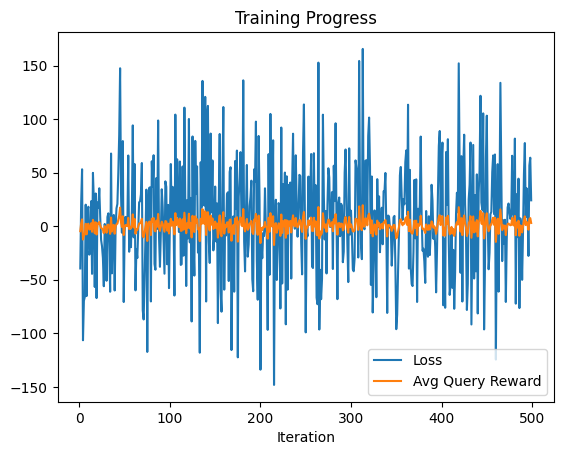

In [17]:
# --- Training ---
policy = train(
    inner_lr=0.01,         # Inner-loop step size (adaptation)
    outer_lr=0.001,        # Outer-loop meta-update step size
    inner_steps=1,         # Number of gradient steps for adaptation (MAML paper usually 1-5)
    meta_batch_size=5,     # Number of tasks sampled per meta-update
    max_episode_len=200,   # Max steps per episode
    gamma=0.99             # Discount factor
)


In [18]:
env = HalfCheetahBackward()
evaluate(policy, env, num_episodes=10)

Mean Reward: 18.14


In [19]:
show_video('./Final_Evaluation.mp4')